# IS 4487 Module 5

## Outline

 - Identify the target variable for an analysis based on the business problem.
 - Compute the mean of a binary variable.
 - Plot a numeric (or count) variable against a categorical
    variable.
 - Calculate a count (and a proportion) for a categorical variable
    and visualize the result into a plot.

<a href="https://colab.research.google.com/github/Stan-Pugsley/is_4487_base/blob/main/Labs/Scripts/lab_05_megatelco_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Megatelco Data Dictionary

 DEMOGRAPHIC VARIABLES:
 - College - has the customer attended some college (one, zero)
 - Income - annual income of customer
 - House - estimated price of the customer's home (if applicable)

 USAGE VARIABLES:
 - Data Overage Mb - Average number of megabytes that the customer used in excess of the plan limit (over last 12 months)
 - Data Leftover Mb - Average number of megabytes that the customer use was below the plan limit (over last 12 months)
 - Data Mb Used - Average number of megabytes used per month (over last 12 months)
 - Text Message Count - Average number of texts per month (over last 12 months)
 - Over 15 Minute Calls Per Month - Average number of calls over 15 minutes in duration per month (over last 12 months)
 - Average Call Duration- Average call duration (over last 12 months)

PHONE VARIABLES:
 - Operating System - Current operating system of phone
 - Handset Price - Retail price of the phone used by the customer

ATTITUDINAL VARIABLES:
 - Reported Satisfaction - Survey response to "How satisfied are you with your current phone plan?" (high, med, low)
 - Reported Usage Level - Survey response to "How much do your use your phone?" (high, med, low)
 - Considering Change of Plan - Survey response to "Are you currently planning to change companies when your contract expires?" (high, med, low)

OTHER VARIABLES
 - Leave - Did this customer churn with the last contract expiration? (LEAVE, STAY)
 - ID - Customer identifier

##Load Libraries

In this class we will be using
- Pandas
- Scikitlearn
- Matplotlib


In [65]:
import pandas as pd
import matplotlib as mpl
import sklearn as sl

## Import Data into Dataframe

➡️ Assignment Tasks
- Import data from the Megatelco dataset into a dataframe (in GitHub go to Labs > DataSets)
- Describe or profile the dataframe


In [66]:
df = pd.read_csv('https://github.com/Stan-Pugsley/is_4487_base/blob/main/Labs/DataSets/megatelco_leave_survey.csv?raw=true')
df.head()

,college,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,reported_satisfaction,reported_usage_level,considering_change_of_plan,leave,id,operating_system
0,one,403137,70,0,6605,199,841317,653,5.0,8,low,low,yes,LEAVE,8183,Android
1,zero,129700,67,16,6028,134,476664,1193,5.0,5,low,low,yes,LEAVE,12501,IOS
2,zero,69741,60,0,1482,176,810225,1037,3.0,8,low,low,yes,STAY,7425,IOS
3,one,377572,0,22,3005,184,826967,1161,0.0,5,low,low,no,LEAVE,13488,IOS
4,zero,382080,0,0,1794,74,951896,1023,0.0,14,low,low,yes,STAY,11389,IOS


In [67]:
df.describe()

,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,id
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,1.499900e+04,14999.000000,14996.000000,14999.000000,14999.000000
mean,241989.140476,153.522502,37.522035,4202.624442,135.622041,8.771616e+05,795.146810,10.568685,9.731515,11859.749517
std,109603.370138,113.018111,28.046409,2202.763649,48.831061,2.870316e+05,1235.785429,8.402100,5.195150,6812.842446
min,-65000.000000,0.000000,0.000000,400.000000,52.000000,-4.630000e+02,215.000000,0.000000,1.000000,2.000000
25%,147822.000000,54.000000,12.000000,2294.000000,93.000000,6.444405e+05,498.000000,3.000000,5.000000,6137.000000
50%,241656.000000,151.000000,35.000000,4223.000000,135.000000,8.764130e+05,778.000000,9.000000,10.000000,11760.000000
75%,336456.500000,242.000000,62.000000,6080.000000,178.000000,1.098834e+06,1064.000000,17.000000,14.000000,17396.000000
max,432000.000000,380.000000,89.000000,8000.000000,220.000000,1.456389e+06,125000.000000,35.000000,19.000000,25354.000000


In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   college                      14999 non-null  object 
 1   income                       14999 non-null  int64  
 2   data_overage_mb              14999 non-null  int64  
 3   data_leftover_mb             14999 non-null  int64  
 4   data_mb_used                 14999 non-null  int64  
 5   text_message_count           14999 non-null  int64  
 6   house                        14999 non-null  int64  
 7   handset_price                14999 non-null  int64  
 8   over_15mins_calls_per_month  14996 non-null  float64
 9   average_call_duration        14999 non-null  int64  
 10  reported_satisfaction        14999 non-null  object 
 11  reported_usage_level         14999 non-null  object 
 12  considering_change_of_plan   14999 non-null  object 
 13  leave           

## Clean up the dataset  

In [69]:
df_clean = df[(df['house'] > 0) & (df['income'] > 0) & (df['handset_price'] < 10000)]
df_clean.describe()

,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,id
count,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,1.499300e+04,14993.00000,14990.000000,14993.000000,14993.000000
mean,242025.183752,153.580804,37.524511,4202.893951,135.626025,8.771541e+05,780.65057,10.571181,9.733676,11862.359501
std,109556.878020,113.002587,28.044642,2202.492183,48.837544,2.869273e+05,326.59192,8.401508,5.194211,6812.221611
min,52491.000000,0.000000,0.000000,400.000000,52.000000,3.200010e+05,215.00000,0.000000,1.000000,2.000000
25%,147844.000000,54.000000,12.000000,2297.000000,93.000000,6.444950e+05,498.00000,3.000000,5.000000,6141.000000
50%,241656.000000,151.000000,35.000000,4223.000000,135.000000,8.762710e+05,778.00000,9.000000,10.000000,11765.000000
75%,336470.000000,242.000000,62.000000,6080.000000,178.000000,1.098785e+06,1064.00000,17.000000,14.000000,17398.000000
max,432000.000000,380.000000,89.000000,8000.000000,220.000000,1.456389e+06,1350.00000,35.000000,19.000000,25354.000000


## Calculate distribution of the outcome  

What is the proportion of people who churned?

In [70]:
df_clean[['house','leave']].groupby('leave').mean().round(2)

,house
leave,
LEAVE,757607.46
STAY,995921.88


# Create basic charts

- Bar chart
- Histogram
- Box plot
- Scatter plot

<Axes: xlabel='leave'>

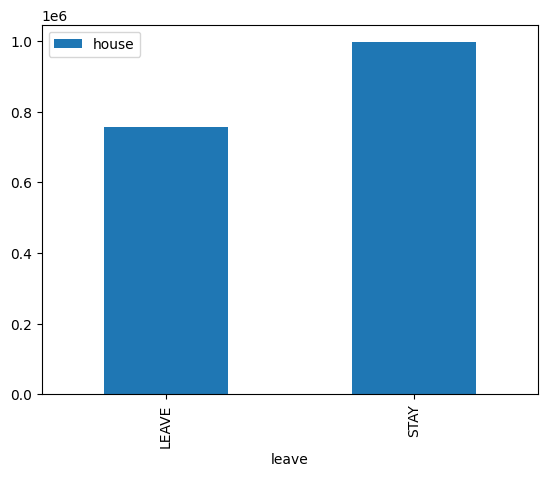

In [71]:
#Bar chart
df_clean[['house','leave']].groupby('leave').mean('house').plot.bar()


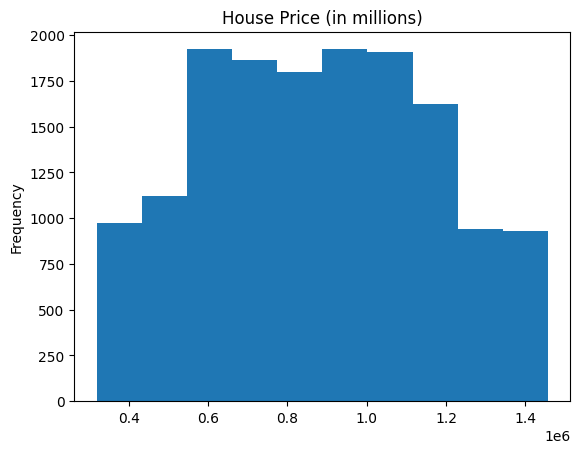

In [72]:
#Histogram
hist = df_clean['house'].plot.hist(bins=10,title='House Price (in millions)')


<Axes: title={'center': 'house'}, xlabel='[leave]'>

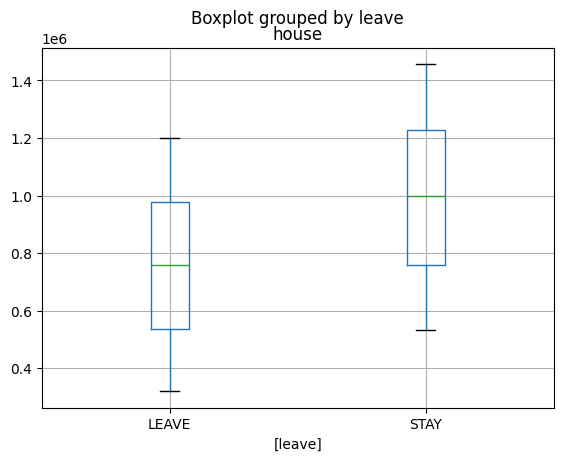

In [73]:
#Boxplot
df_clean[['leave','house']].boxplot(by='leave')

# Explore Relationships

###How does College affect leaving?

<Axes: xlabel='leave'>

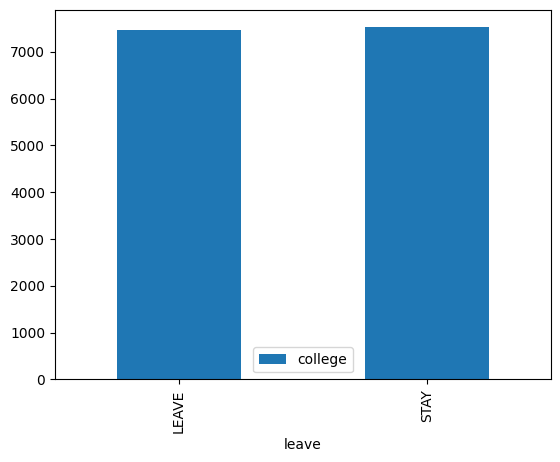

In [74]:
#Bar chart with counts
df_clean[['college','leave']].groupby('leave').count().plot.bar()

<Axes: xlabel='leave'>

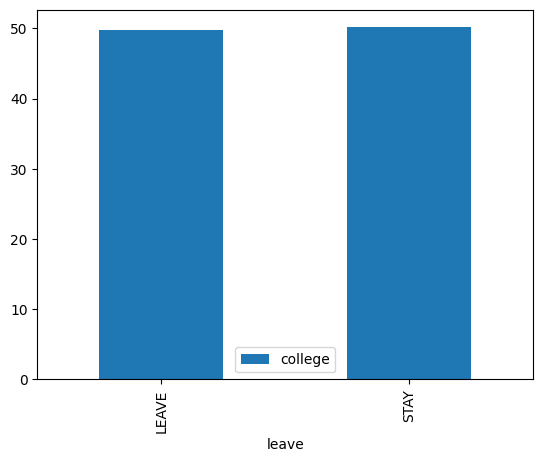

In [75]:
#Bar chart with percentage
college_summary = df_clean[['college','leave']].groupby('leave').count()

college_summary['college'] = (college_summary['college'] / college_summary['college'].sum()) * 100
#college_summary.head()
college_summary.plot.bar()

### How does phone price affect leaving?

<Axes: xlabel='leave'>

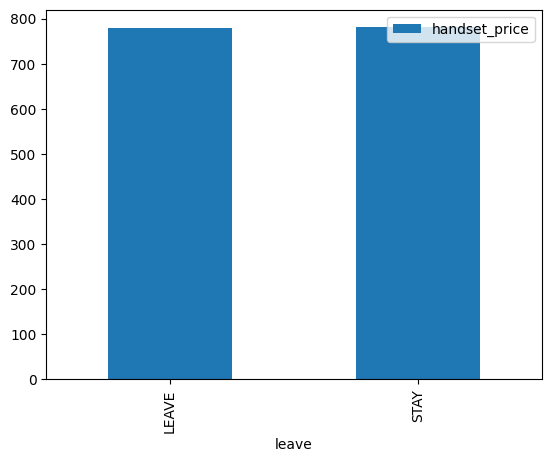

In [76]:
#Bar chart with mean price
handset_price_summary = df_clean[['handset_price','leave']].groupby('leave').mean(['handset_price'])
#handset_price_summary.head()

handset_price_summary.plot.bar()

### How about considering leaving?

<Axes: xlabel='leave'>

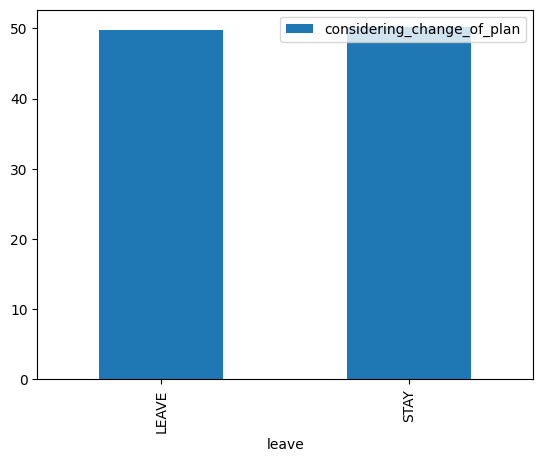

In [77]:
#Bar chart with percentage
plan = df_clean[['considering_change_of_plan','leave']].groupby('leave').count()

plan['considering_change_of_plan'] = (plan['considering_change_of_plan'] / plan['considering_change_of_plan'].sum()) * 100

plan.plot.bar()

## Create a Pair Plot
➡️ Assignment Tasks
- Import seaborn
- Create a Seaborn "pairplot" using all variables, with the color determine by "leave"
- Display the plot

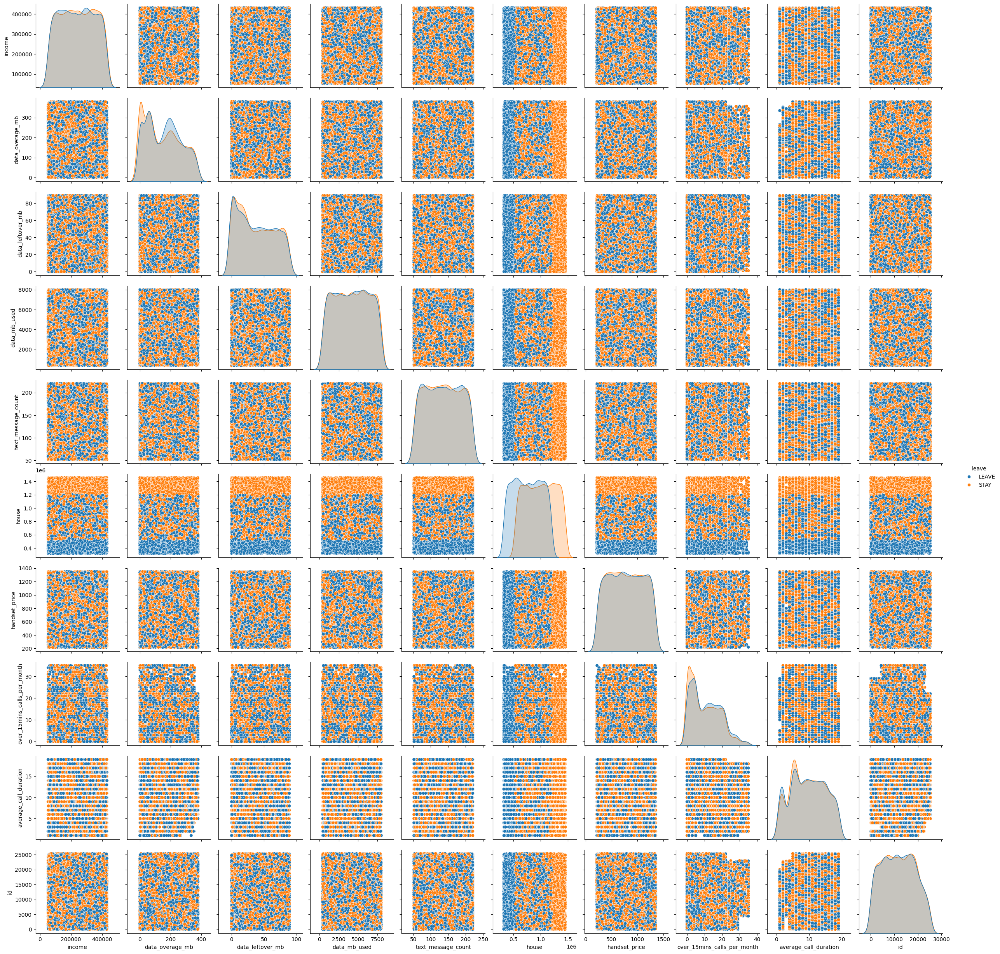

In [78]:
#pair plot
import seaborn as sns
sns.pairplot(df_clean, hue='leave')

## Additional Cleanup

➡️ Assignment Tasks
- Remove any records with null values from the dataframe

In [79]:
df_clean.dropna()

,college,income,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,house,handset_price,over_15mins_calls_per_month,average_call_duration,reported_satisfaction,reported_usage_level,considering_change_of_plan,leave,id,operating_system
0,one,403137,70,0,6605,199,841317,653,5.0,8,low,low,yes,LEAVE,8183,Android
1,zero,129700,67,16,6028,134,476664,1193,5.0,5,low,low,yes,LEAVE,12501,IOS
2,zero,69741,60,0,1482,176,810225,1037,3.0,8,low,low,yes,STAY,7425,IOS
3,one,377572,0,22,3005,184,826967,1161,0.0,5,low,low,no,LEAVE,13488,IOS
4,zero,382080,0,0,1794,74,951896,1023,0.0,14,low,low,yes,STAY,11389,IOS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,one,307114,12,28,4672,104,1086834,375,7.0,8,low,low,yes,STAY,4691,Android
14995,one,429983,312,43,5858,201,378442,1205,12.0,13,low,low,no,LEAVE,9134,IOS
14996,one,363250,348,82,1812,157,443929,1191,19.0,12,low,low,no,LEAVE,10974,IOS
14997,zero,221768,334,55,3552,211,987655,529,11.0,18,low,low,yes,LEAVE,23071,Android


## Summarize Data

➡️ Assignment Tasks
- Create a second set of charts that include the outlier values (house, income, price).   How do the outliers affect the values in the charts?

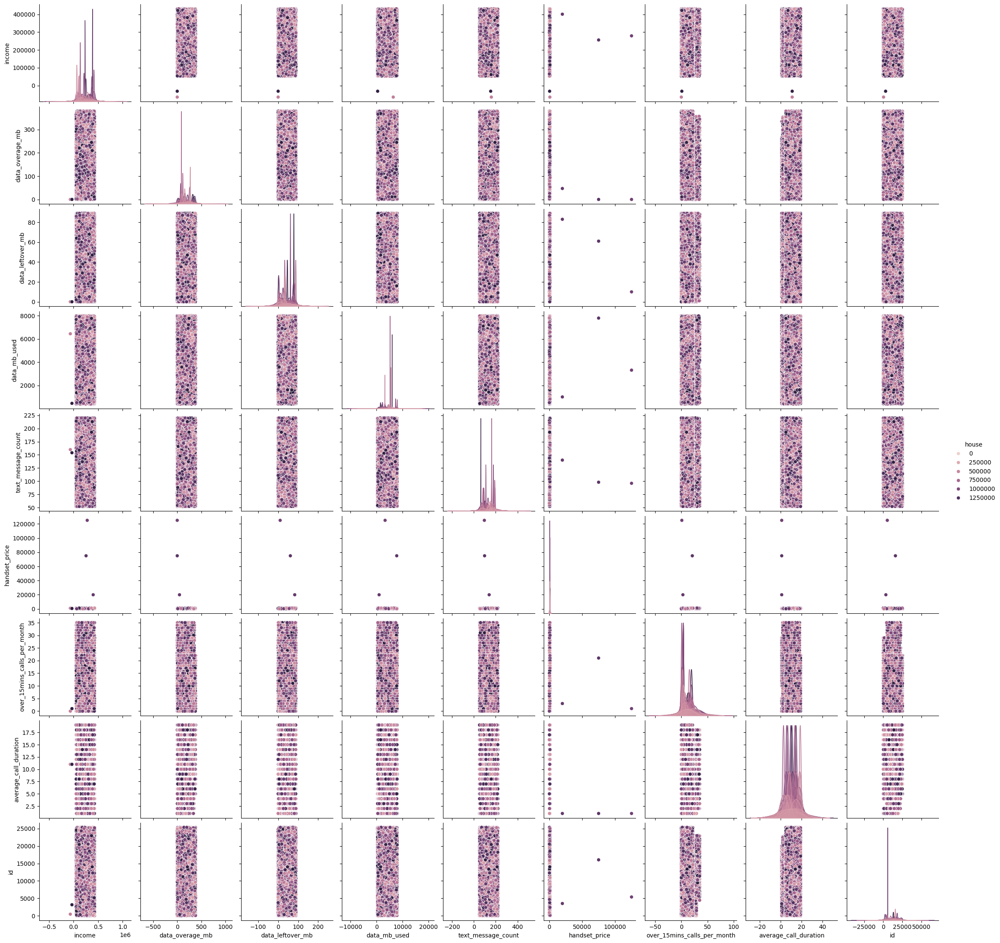

In [80]:
#house price
sns.pairplot(df, hue = 'house')

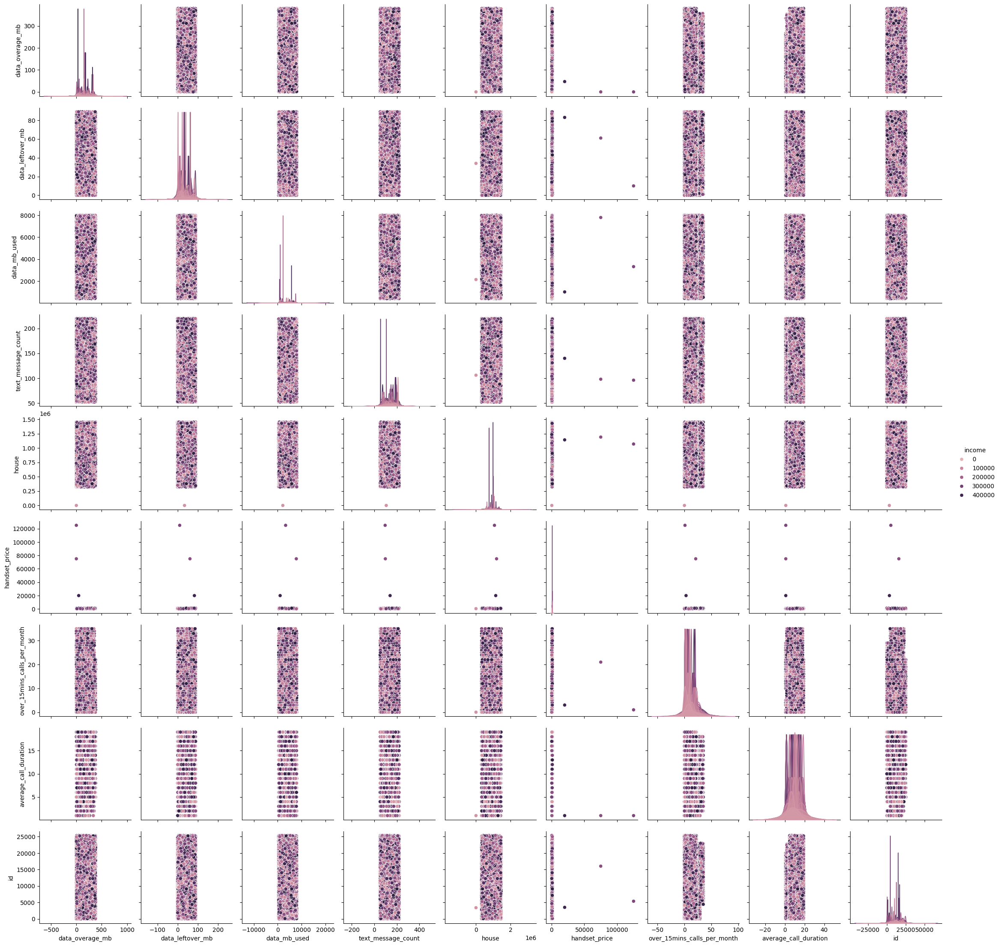

In [81]:
#income
sns.pairplot(df, hue = 'income')

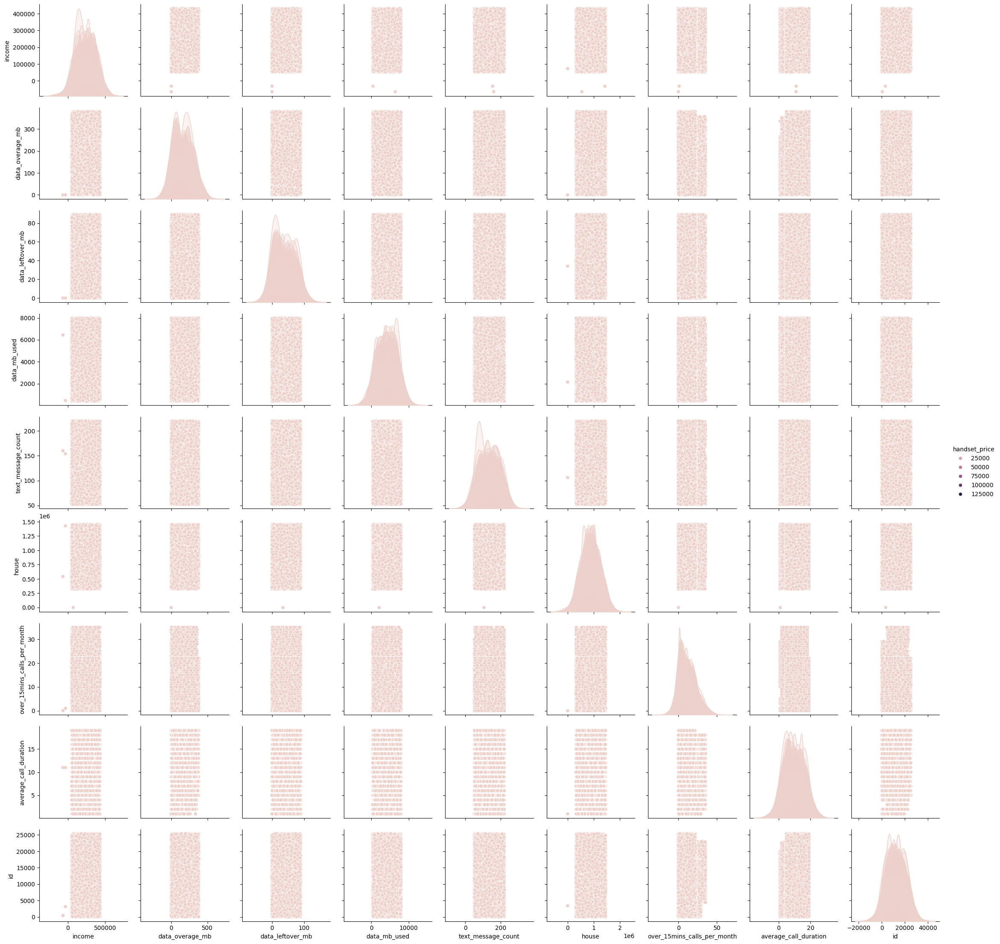

In [82]:
#price
sns.pairplot(df, hue = 'handset_price')

## Covariance

➡️ Assignment Task
- Create a covariance matrix using all of the applicable independent variables

In [83]:
#matrix
numerical_cols = ['income', 'house', 'handset_price', 'data_overage_mb',
                  'data_leftover_mb', 'data_mb_used', 'text_message_count',
                  'over_15mins_calls_per_month', 'average_call_duration']
covariance_matrix = df_clean[numerical_cols].cov()
#print covariance matrix
covariance_matrix

,income,house,handset_price,data_overage_mb,data_leftover_mb,data_mb_used,text_message_count,over_15mins_calls_per_month,average_call_duration
income,1.200271e+10,1.756157e+08,138564.192214,12038.416681,30377.936898,1.021421e+06,31746.642963,-477.490563,7580.287935
house,1.756157e+08,8.232730e+10,601300.679268,-865490.913906,68790.126105,-2.104015e+05,34621.958817,-31468.232997,6987.274903
handset_price,1.385642e+05,6.013007e+05,106662.282173,45.395200,14.318231,6.544922e+03,52.716032,14.469424,-2.092668
data_overage_mb,1.203842e+04,-8.654909e+05,45.395200,12769.584602,435.879773,-5.656925e+02,21.980227,280.780052,133.013884
data_leftover_mb,3.037794e+04,6.879013e+04,14.318231,435.879773,786.501951,4.018753e+02,-9.093521,20.130598,-2.343025
data_mb_used,1.021421e+06,-2.104015e+05,6544.922319,-565.692537,401.875265,4.850972e+06,-65.704550,20.603035,-284.756501
text_message_count,3.174664e+04,3.462196e+04,52.716032,21.980227,-9.093521,-6.570455e+01,2385.105665,2.487227,0.097433
over_15mins_calls_per_month,-4.774906e+02,-3.146823e+04,14.469424,280.780052,20.130598,2.060304e+01,2.487227,70.585333,4.303671
average_call_duration,7.580288e+03,6.987275e+03,-2.092668,133.013884,-2.343025,-2.847565e+02,0.097433,4.303671,26.979827


➡️ Assignment Task
- In 100 words or less, describe what insight you can derive from the covariance matrix.  What does it tell us about the data?  

Based on the matrix, we can see that there's a high positive covariance between income and house, likely indicating that as income increases so does the chances of owning a house. data_mb_used and income also had high positive covariance which could be suggesting that higher income is associated with higher data usage. For negative covariances relationships, house and data_ovarag_mb was at (-8.65x10^5), which could be interpreted as that as house ownership increases, data overage decreases. income and over_15mins_calls_per_month showed significant negative covariance. This could be interpreted as that higher-income individuals make less phone calls over 15 min long. text_message_count & average_call_duration showed little to no relationship.

In [84]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [85]:
!jupyter nbconvert --to html "/content/drive/My Drive/Colab Notebooks/Buss. Analytics/lab5.ipynb"

[NbConvertApp] Converting notebook /content/drive/My Drive/Colab Notebooks/Buss. Analytics/lab5.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 11 image(s).
[NbConvertApp] Writing 17392573 bytes to /content/drive/My Drive/Colab Notebooks/Buss. Analytics/lab5.html
